<a href="https://colab.research.google.com/github/eecheonwu/ammi_ml-proj/blob/main/AMMI_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AMMI project: "Geo Object Detection"

Supervisor: Dr. Y. Y. ZIGGAH
PhD, MEng (Geodesy and Survey Engineering)
BSc (Geomatic Engineering)
University of Mines and Technology
Department of Geomatic Engineering
P.O. Box 237,
Tarkwa-Western Region
Ghana
West Africa 

# Create and Annotate Datasets

In [ ]:
import os, gdal

In [ ]:
in_path = '/home/emmanuel/AMMI_Project/'
input_filename = 'Orthophoto.tif'

In [ ]:
out_path = '/home/emmanuel/AMMI_Project/Datasets/'
output_filename = 'tile_'

In [ ]:
tile_size_x = 2000
tile_size_y = 2000

In [ ]:
ds = gdal.Open(in_path + input_filename)
band = ds.GetRasterBand(1)
xsize = band.XSize
ysize = band.YSize

In [ ]:
for i in range(0, xsize, tile_size_x):
    for j in range(0, ysize, tile_size_y):
        com_string = "gdal_translate -of GTIFF -srcwin " + str(i)+ ", " + str(j) + ", " + str(tile_size_x) + ", " + str(tile_size_y) + " " + str(in_path) + str(input_filename) + " " + str(out_path) + str(output_filename) + str(i) + "_" + str(j) + ".tif"
        os.system(com_string)


In [ ]:
! labelImg

# Download Dataset

In [1]:
! git clone https://github.com/eecheonwu/ammi_ml-proj.git

Cloning into 'ammi_ml-proj'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 735 (delta 0), reused 0 (delta 0), pack-reused 732
Receiving objects: 100% (735/735), 1.17 GiB | 32.72 MiB/s, done.
Resolving deltas: 100% (415/415), done.
Checking out files: 100% (475/475), done.


# Install Utility software

In [2]:
!pip install git+https://github.com/microsoft/ComputerVision.git@master#egg=utils_cv

  Cloning https://github.com/microsoft/ComputerVision.git (to revision master) to /tmp/pip-install-6b89jchn/utils-cv
  Running command git clone -q https://github.com/microsoft/ComputerVision.git /tmp/pip-install-6b89jchn/utils-cv
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 215kB 10.0MB/s 
     |████████████████████████████████| 983kB 9.2MB/s 
     |████████████████████████████████| 81kB 10.8MB/s 
     |████████████████████████████████| 2.1MB 27.7MB/s 
     |████████████████████████████████| 112kB 40.1MB/s 
     |████████████████████████████████| 14.1MB 198kB/s 
     |████████████████████████████████| 1.0MB 52.0MB/s 
     |████████████████████████████████| 2.6MB 49.9MB/s 
     |████████████████████████████████| 112kB 56.7MB/s 
     |████████████████████████████████| 727kB 46.2MB/s 
     |██████████████████

In [3]:
! pip install detecto

# Import libraries

In [4]:
import os
import torch
import torchvision
from utils_cv.detection.dataset import DetectionDataset, get_transform
from utils_cv.detection.plot import (
    plot_grid,
    plot_boxes,
    plot_pr_curves,
    PlotSettings,
    plot_counts_curves,
    plot_detections
)
from utils_cv.detection.model import (
    DetectionLearner,
    get_pretrained_fasterrcnn,
)




In [5]:
import matplotlib.pyplot as plt
from detecto import utils, visualize
from detecto.utils import read_image
from detecto.utils import xml_to_csv
from detecto.visualize import show_labeled_image
from torchvision import transforms
from detecto.utils import normalize_transform
from detecto.core import DataLoader,Dataset, Model
from detecto.visualize import plot_prediction_grid

In [6]:
from utils_cv.common.gpu import which_processor, is_windows

# Change matplotlib backend so that plots are shown for windows
if is_windows():
    plt.switch_backend("TkAgg")

print(f"TorchVision: {torchvision.__version__}")
which_processor()

TorchVision: 0.8.1+cu101
Torch is using GPU: Tesla T4


In [7]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using torch device: {device}")

Using torch device: cuda


In [8]:
# Ensure edits to libraries are loaded and plotting is shown in the notebook.
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Model 1

# Dataset Preparation

In [ ]:
data = DetectionDataset(root= "/content/ammi_ml-proj", anno_dir="annotations", im_dir= "images", train_pct= 0.81 )

In [ ]:
print(
    f"Training dataset: {len(data.train_ds)} | Training DataLoader: {data.train_dl} \
    \nTesting dataset: {len(data.test_ds)} | Testing DataLoader: {data.test_dl}"
)

Training dataset: 96 | Training DataLoader: <torch.utils.data.dataloader.DataLoader object at 0x7f7e2f400dd8>     
Testing dataset: 22 | Testing DataLoader: <torch.utils.data.dataloader.DataLoader object at 0x7f7e2f1e6080>


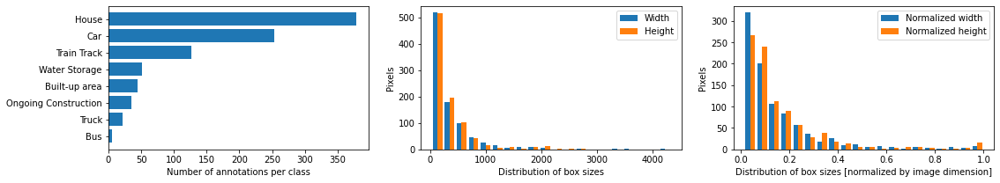

In [ ]:
data.plot_boxes_stats()

Transformations applied on /content/ammi_ml-proj/images/tile_24000_12000.tif:


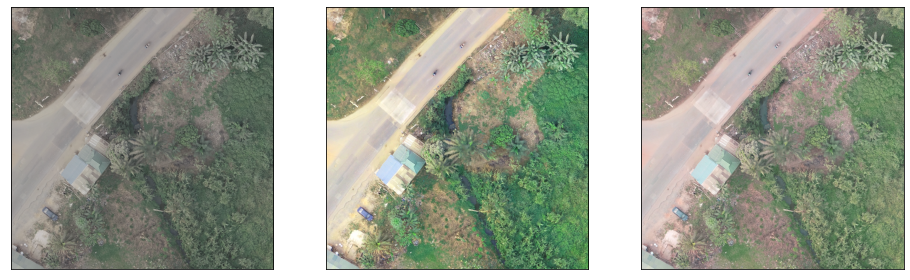

In [ ]:
data.train_ds.dataset.show_im_transformations()

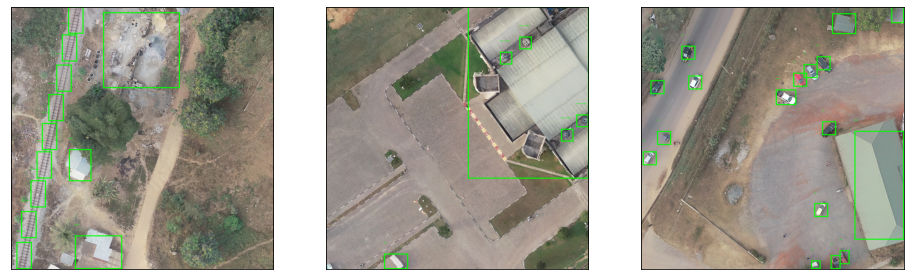

In [ ]:
data.show_ims(rows=1)

# Define Model

In [ ]:
detector = DetectionLearner(data, im_size=2000, labels=["House", "Car", "Ongoing Construction", "Built-up area", "Water Storage", "Bus", "Truck", "Train Track"])
print(f"Model: {type(detector.model)}")

2020-11-20 10:12:25,555 - trains.model - INFO - Selected model id: 97b12d91d2324ad2971f2632a27321fd
Model: <class 'torchvision.models.detection.faster_rcnn.FasterRCNN'>


# Train Model

In [ ]:
skip_evaluation = device.type == 'cpu'

In [ ]:
detector.fit(epochs=10, lr=0.01, momentum=0.4, weight_decay=0.03, print_freq=40, step_size=2, gamma=0.2, skip_evaluation=skip_evaluation)

Epoch: [0]  [ 0/48]  eta: 0:19:19  lr: 0.000223  loss: 0.5438 (0.5438)  loss_classifier: 0.2018 (0.2018)  loss_box_reg: 0.2291 (0.2291)  loss_objectness: 0.0162 (0.0162)  loss_rpn_box_reg: 0.0967 (0.0967)  time: 24.1553  data: 21.1535  max mem: 9487
Epoch: [0]  [10/48]  eta: 0:04:29  lr: 0.002348  loss: 0.9000 (1.1269)  loss_classifier: 0.2422 (0.3470)  loss_box_reg: 0.3233 (0.4465)  loss_objectness: 0.0243 (0.0283)  loss_rpn_box_reg: 0.3163 (0.3052)  time: 7.0837  data: 4.6681  max mem: 9487
Epoch: [0]  [20/48]  eta: 0:02:14  lr: 0.004474  loss: 1.2359 (1.1982)  loss_classifier: 0.4110 (0.3915)  loss_box_reg: 0.5258 (0.5038)  loss_objectness: 0.0270 (0.0330)  loss_rpn_box_reg: 0.2763 (0.2699)  time: 3.8201  data: 1.5236  max mem: 9487
Epoch: [0]  [30/48]  eta: 0:01:11  lr: 0.006599  loss: 1.2359 (1.1131)  loss_classifier: 0.3998 (0.3745)  loss_box_reg: 0.5010 (0.4787)  loss_objectness: 0.0211 (0.0266)  loss_rpn_box_reg: 0.0563 (0.2334)  time: 2.2279  data: 0.0207  max mem: 9487
Epoch:

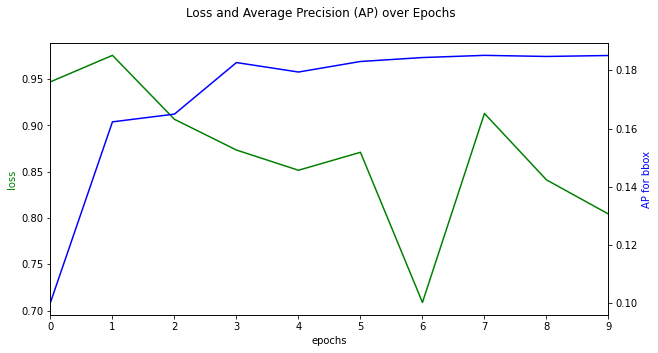

In [ ]:
if not skip_evaluation:
    detector.plot_precision_loss_curves()

In [ ]:
if not skip_evaluation:
    e = detector.evaluate()

creating index...
index created!
Test:  [ 0/11]  eta: 0:00:50  model_time: 0.9687 (0.9687)  evaluator_time: 0.0540 (0.0540)  time: 4.5580  data: 3.3761  max mem: 9487
Test:  [10/11]  eta: 0:00:01  model_time: 0.8978 (0.9046)  evaluator_time: 0.0113 (0.0158)  time: 1.2850  data: 0.3235  max mem: 9487
Test: Total time: 0:00:14 (1.3344 s / it)
Averaged stats: model_time: 0.8978 (0.9046)  evaluator_time: 0.0113 (0.0158)
Accumulating evaluation results...
DONE (t=0.03s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.185
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.419
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.103
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.185
 Average Recall     (AR) @[ IoU

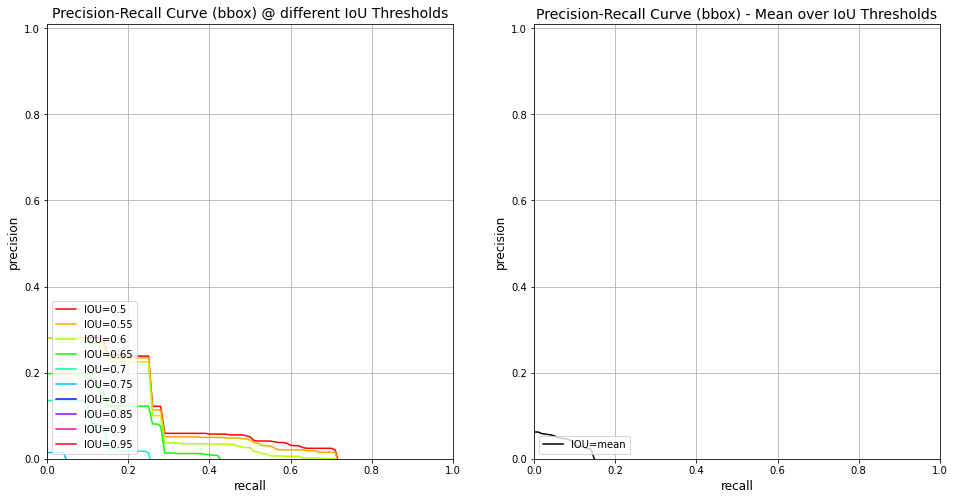

In [ ]:
if not skip_evaluation:
    plot_pr_curves(e)

# Model Prediction Test

In [ ]:
detections = detector.predict_dl(data.test_dl, threshold=0.5)

In [ ]:
detections[:5]

[{'det_bboxes': [{Bbox object: [left=156, top=1165, right=567, bottom=1646] | <House> | label:4 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.9528210759162903,
   {Bbox object: [left=1669, top=1255, right=1997, bottom=1578] | <House> | label:4 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.9515783190727234,
   {Bbox object: [left=227, top=121, right=347, bottom=288] | <Car> | label:6 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.9502792358398438,
   {Bbox object: [left=1502, top=1148, right=1634, bottom=1283] | <Car> | label:6 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.9451830387115479,
   {Bbox object: [left=382, top=186, right=487, bottom=346] | <Car> | label:6 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.943487286567688,
   {Bbox object: [left=226, top=452, right=359, bottom=587] | <Car> | label:6 | path:/content/ammi_ml-proj/images/tile_20000_16000.tif} | score: 0.9

In [ ]:
print(
    f"Number of detections: {len(detections)}\nNumber of test images: {len(data.test_ds)}"
)

Number of detections: 22
Number of test images: 22


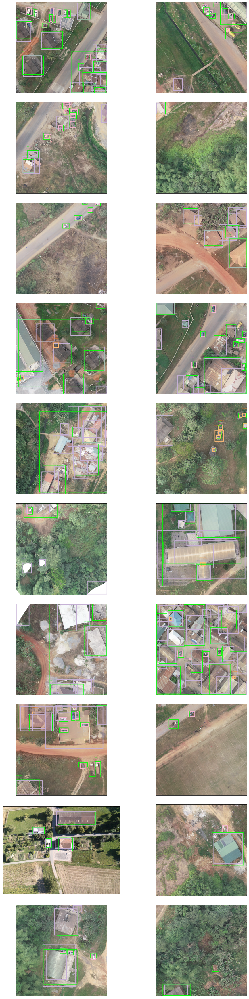

In [ ]:
def _grid_helper():
    for detection in detections:
        yield detection, data, None, None 
plot_grid(plot_detections, _grid_helper(), rows=10, cols=2)

# Model 2

# Data Augumentation

In [9]:
custom_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(2000),
    transforms.RandomHorizontalFlip(0.5),
    transforms.ColorJitter(saturation=0.2),
    transforms.ToTensor(),  # required
    normalize_transform(),  # required
])

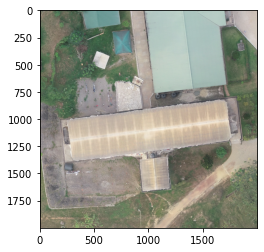

In [10]:
image = read_image('/content/ammi_ml-proj/images/tile_10000_10000.tif')
plt.imshow(image)
plt.show()

In [11]:
xml_to_csv('/content/ammi_ml-proj/annotations/', 'train_labels.csv')
xml_to_csv('/content/ammi_ml-proj/val_anno/', 'val_labels.csv')
xml_to_csv('/content/ammi_ml-proj/test_anno/', 'test_labels.csv')


train_dataset = Dataset('train_labels.csv', '/content/ammi_ml-proj/images/', transform=custom_transforms)
val_dataset = Dataset('val_labels.csv', '/content/ammi_ml-proj/validation/')
test_dataset = Dataset('test_labels.csv', '/content/ammi_ml-proj/test/')

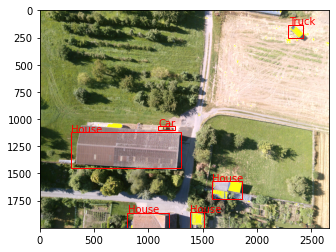

In [12]:
image, targets = train_dataset[1]
show_labeled_image(image, targets['boxes'], targets['labels'])

# Train Model

In [13]:
object_labels = ['House', 'Car', 'Ongoing Construction', 'Built-up area', 'Water Storage', 'Bus', 'Truck', 'Train Track']
model = Model(object_labels)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


In [99]:
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader =  DataLoader(val_dataset, batch_size=2, shuffle=False)
losses = model.fit(train_loader, val_dataset, epochs=20, learning_rate=1e-06,verbose=True)
plt.plot(losses)
plt.show()

  0%|          | 0/59 [00:00<?, ?it/s]

Epoch 1 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.7976225800812244
Epoch 2 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.7963595762848854
Epoch 3 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.8089584720631441
Epoch 4 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.8016965116063753
Epoch 5 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.8079798060158888
Epoch 6 of 20
Begin iterating over training dataset


  0%|          | 0/12 [00:00<?, ?it/s]

Begin iterating over validation dataset


  0%|          | 0/59 [00:00<?, ?it/s]

Loss: 0.8064832985401154
Epoch 7 of 20
Begin iterating over training dataset


 15%|█▌        | 9/59 [00:08<00:49,  1.00it/s]

KeyboardInterrupt: ignored

# Predicton

In [15]:
images = []
for i in range(9):
    image, _ = test_dataset[i]
    images.append(image)

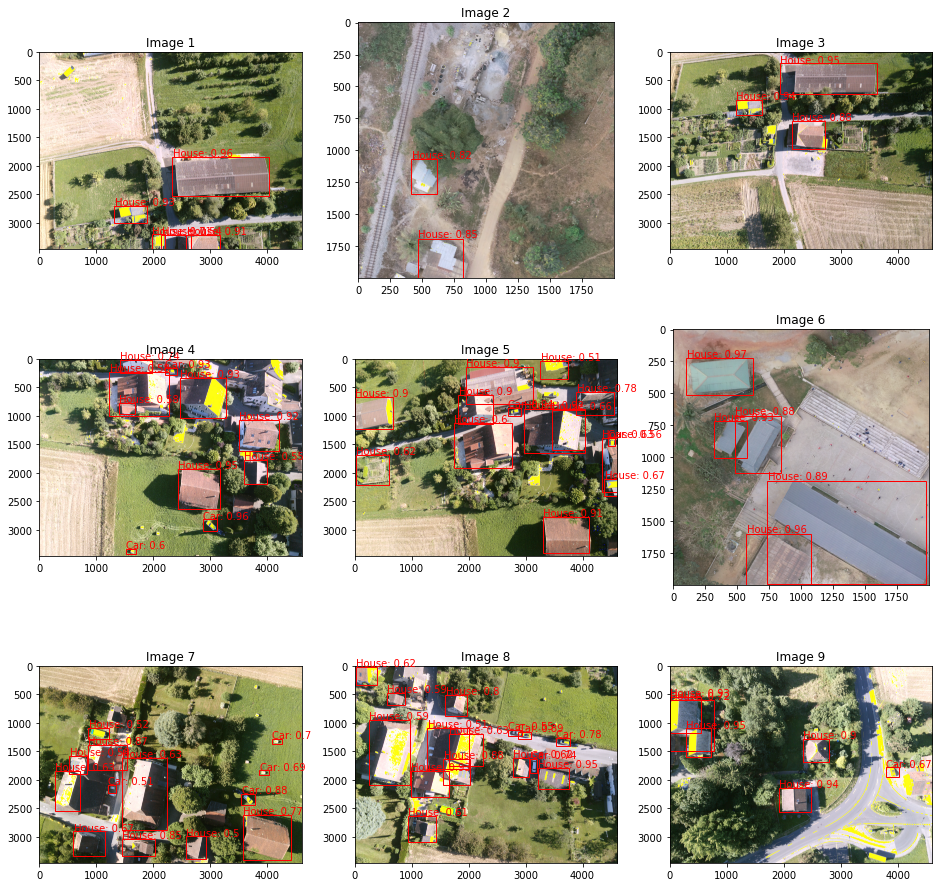

In [23]:
plot_prediction_grid(model, images, dim=(3, 3), figsize=(16, 16), score_filter=0.5)

# Optimization

In [33]:
! pip install ax-platform

     |████████████████████████████████| 501kB 9.0MB/s 
     |████████████████████████████████| 225kB 17.5MB/s 
     |████████████████████████████████| 296kB 16.9MB/s 
  Created wheel for gpytorch: filename=gpytorch-1.2.1-py2.py3-none-any.whl size=463973 sha256=559f412d2fd5659da2eda74b70001ebf908245b0c581b1844efc1d7b4875eb5e
  Stored in directory: /root/.cache/pip/wheels/2e/d5/dc/0a984c2acc9b35f9860f543c10732442c2cd5719d923236017
Successfully built gpytorch


In [91]:
from ax.plot.contour import plot_contour
from ax.plot.trace import optimization_trace_single_method
from ax.service.managed_loop import optimize
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.utils.measurement.synthetic_functions import hartmann6
import numpy as np

init_notebook_plotting()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

[INFO 11-23 14:19:09] ipy_plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [92]:
torch.manual_seed(12345)
dtype = torch.float

In [122]:
def train(parameterization):
    model = Model(object_labels)
    for step in range(2):
      loss = model.fit(train_loader, val_dataset, epochs=0, learning_rate=np.array(parameterization.get("lr")),verbose=True)
    mean = np.mean(loss, keepdims=True)
    std = np.std(loss)
    return {"mean": mean, "std": std}

In [123]:
best_parameters, best_values, experiment, model = optimize(
    parameters=[
        {"name": "lr", "type": "range", "bounds": [1e-6, 0.4], "log_scale": True},
      ],
    evaluation_function=train,
  )

[INFO 11-23 15:19:13] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 5 arms, GPEI for subsequent arms], generated 0 arm(s) so far). Iterations after 5 will take longer to generate due to model-fitting.
[INFO 11-23 15:19:13] ax.service.managed_loop: Started full optimization with 20 steps.
[INFO 11-23 15:19:13] ax.service.managed_loop: Running optimization trial 1...


TypeError: ignored

In [73]:
plt.plot(loss)
plt.show()